In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.preprocessing import QuantileTransformer, StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import davies_bouldin_score, silhouette_score
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

In [ ]:
rfm = pd.read_csv("./../../data/rfmv.csv")

In [ ]:
# Cleaning
rfm = rfm.dropna()
rfm = rfm.query("recency > 0 & frequency > 0 and monetary > 0 and variety > 0")
min_recency = rfm.recency.min()

rfm["recency"] = (rfm.recency - min_recency) + 1

In [ ]:
# Transforming
scaler = QuantileTransformer(random_state=0, output_distribution="normal")
scaler.fit(rfm)

scaled_customers = scaler.transform(rfm)

print(scaled_customers)

In [ ]:
# Outlier detection
# nearest_neighbors = NearestNeighbors(n_neighbors=8).fit(scaled_customers)
# distances, idx = nearest_neighbors.kneighbors(scaled_customers)
# distances = np.sort(distances, axis=0)
# distances = distances[:, 1]
# fig = px.line(None, y=distances, title="Evaluation of epsilon")
# fig.show()

In [ ]:
# Compute DBSCAN
# report = []
# for eps_value in np.arange(1.4, 2.0, 0.1):
#     dbscan = DBSCAN(eps=eps_value, min_samples=8, n_jobs=4).fit(scaled_customers)
#     labels = dbscan.labels_
#
#     # Number of clusters in labels, ignoring noise if present.
#     n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
#     n_noise_ = list(labels).count(-1)
#     score = silhouette_score(scaled_customers, labels)
#     report.append(
#         {
#             "eps": eps_value,
#             "n_clusters": n_clusters_,
#             "noise_points": n_noise_,
#             "silhouette_score": score,
#         }
#     )
#
# df_report = pd.DataFrame(report)
# df_report.plot(
#     title="Exploring eps value for an optimal silhouette score",
#     x="eps",
#     y="silhouette_score",
# )
#
# df_report

In [14]:
# Compute DBSCAN
dbscan = DBSCAN(eps=1.45, min_samples=8, n_jobs=4).fit(scaled_customers)
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

print("Silhouette Coefficient: %0.3f" % silhouette_score(scaled_customers, labels))

Estimated number of clusters: 5
Estimated number of noise points: 14
Silhouette Coefficient: 0.579


In [15]:
print(list(labels).count(0))
print(list(labels).count(1))
print(list(labels).count(2))
print(list(labels).count(3))
print(list(labels).count(4))

83340
53027
12
37
9


In [16]:
# Remove the outliers
labeled_customers = pd.DataFrame(scaled_customers)
rfm["dbscan_labels"] = labels
labeled_customers["dbscan_labels"] = labels

labeled_customers = labeled_customers[labeled_customers.dbscan_labels != -1]
rfm = rfm[rfm.dbscan_labels != -1]

In [17]:
# Preparation for KMeans

scaler = StandardScaler()
kmeans_customers = rfm[["recency", "frequency", "monetary", "variety"]].copy()

scaler.fit(kmeans_customers)

scaled_customers = scaler.transform(kmeans_customers)

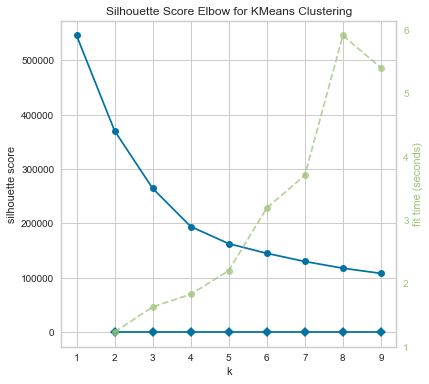

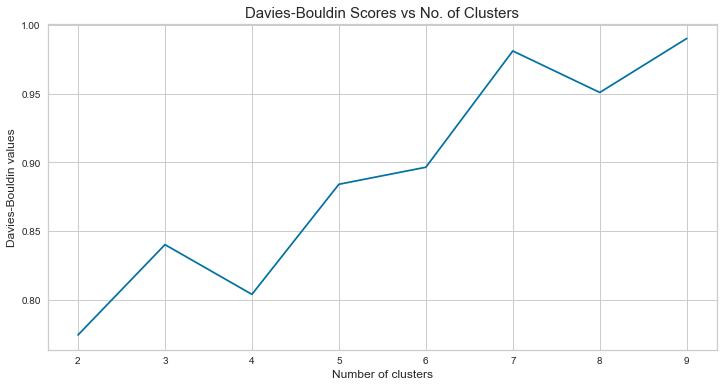

In [18]:
# # Run the Kmeans algorithm and get the index of data points clusters
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(scaled_customers)
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, "-o")
plt.xlabel(r"Number of clusters *k*")
plt.ylabel("Sum of squared distance")

kmeans = KMeans()
visualizer = KElbowVisualizer(
    kmeans, k=(2, 10), metric="silhouette", locate_elbow=False
)
# Fit the data and visualize
visualizer.fit(scaled_customers)
visualizer.show()

db_scores = {}

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_customers)
    labels = kmeans.labels_
    db_scores[k] = davies_bouldin_score(scaled_customers, labels)

# Plotting Davies-Bouldin Scores
plt.figure(figsize=(12, 6))
plt.plot(list(db_scores.keys()), list(db_scores.values()))
plt.xlabel("Number of clusters", fontsize=12)
plt.ylabel("Davies-Bouldin values", fontsize=12)
plt.title("Davies-Bouldin Scores vs No. of Clusters", fontsize=15)
plt.show()

In [19]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(scaled_customers)

clusters = kmeans.labels_

rfm["kmeans_cluster"] = clusters
rfm.kmeans_cluster = rfm.kmeans_cluster.astype("category")

fig = px.scatter_3d(
    rfm, x="recency", y="monetary", z="frequency", color="kmeans_cluster", opacity=0.7
)
fig.show()

In [20]:
fig2 = px.scatter_3d(
    rfm, x="recency", y="monetary", z="variety", color="kmeans_cluster", opacity=0.7
)
fig2.show()

In [22]:
print(rfm.kmeans_cluster.value_counts())
print(silhouette_score(scaled_customers, rfm.kmeans_cluster))

1    72211
0    56931
3     6865
2      418
Name: kmeans_cluster, dtype: int64
0.46351823490382704
